# EDA For PolypGen Data for Image Detection

In [ ]:
from pathlib import Path
from typing import Optional, Tuple, List, Dict
import pandas as pd
import numpy as np
from PIL import Image
import random
import matplotlib.pyplot as plt
import seaborn as sns
import re
random.seed(42)

# 1. Dataset Overview

## Dataset Overview  

The **PolypGen dataset (v3)** provides colonoscopy images collected from multiple medical centers.  

Each center folder (`data_C1` … `data_C6`) contains:  
- **`images_*`** → raw colonoscopy frames  
- **`bbox_*`** → text files with bounding box annotations  
- **`bbox_image_*`** → images with bounding boxes drawn for verification  
- **`masks_*`** → segmentation masks of polyps  

The `sequenceData` folders include:  
- **positive sequences** → frames with polyps and corresponding bounding boxes/masks  
- **negative sequences** → polyp-free frames  

Overall, the dataset combines **raw images, bounding box annotations, and segmentation masks** across centers and sequences, with diverse image resolutions and annotation completeness.  

In [4]:

# --- CONFIG: set your PolypGen root here ---
ROOT = Path(r"C:\Users\Betul\Desktop\Projects\Polyp\data\PolypGen2021_MultiCenterData_v3")

# sequence to preview (e.g., "seq12")
SEQ_TO_SHOW = "seq1"

# number of images to show per center subkind (images_* and bbox_images_*)
N_IMG_PER_CENTER_SUBKIND = 2  

# number of bbox txt files to print per center
N_TXT_PER_CENTER = 2

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

## Helper Functions

In [25]:
is_img   = lambda p: p.is_file() and p.suffix.lower() in IMG_EXTS
firstdir = lambda root,prefix: next((d for d in sorted(root.glob(f"{prefix}*")) if d.is_dir()), None)

def img_whc(p: Path):
    try:
        with Image.open(p) as im:
            w,h = im.size
            c = {"RGB":3,"L":1,"RGBA":4,"CMYK":4}.get(im.mode, None)
            return w,h,c
    except Exception: return None,None,None

def find_bbox_txts_for_image(img_path: Path, bbox_root: Path | None):
    """
    Return candidate .txt label files for an image by stem.
    Handles names like <stem>.txt, <stem>_mask.txt, and other variations.
    Searches recursively.
    """
    if not bbox_root or not bbox_root.exists():
        return []
    stem = img_path.stem
    stem_lc = stem.lower()

    # 1) exact match anywhere
    cands = list(bbox_root.rglob(f"{stem}.txt"))
    if cands: return sorted(cands)

    # 2) common suffix variants (e.g., *_mask)
    variants = [f"{stem}_mask.txt", f"{stem}_bbox.txt", f"{stem}_labels.txt"]
    for v in variants:
        cands = list(bbox_root.rglob(v))
        if cands: return sorted(cands)

    # 3) case-insensitive exact
    all_txts = list(bbox_root.rglob("*.txt"))
    ciexact = [p for p in all_txts if p.stem.lower() == stem_lc]
    if ciexact: return sorted(ciexact)

    # 4) contains-stem (prefix/suffix noise)
    contains = [p for p in all_txts if stem_lc in p.stem.lower()]
    return sorted(contains)

def read_abs_bboxes(txt: Path):
    # expects lines like:
    #   xmin ymin xmax ymax
    #   polyp xmin ymin xmax ymax
    boxes = []
    if not (txt and txt.exists() and txt.is_file()):
        return boxes
    try:
        for ln in txt.read_text(encoding="utf-8", errors="ignore").splitlines():
            parts = ln.strip().split()
            if not parts:
                continue
            # if first token isn't numeric (e.g., 'polyp'), drop it
            try:
                float(parts[0])
            except ValueError:
                parts = parts[1:]
            # take the first 4 numbers if available
            if len(parts) >= 4:
                try:
                    x1, y1, x2, y2 = map(float, parts[:4])
                    # normalize swapped corners if present
                    if x2 < x1: x1, x2 = x2, x1
                    if y2 < y1: y1, y2 = y2, y1
                    boxes.append((x1, y1, x2, y2))
                except Exception:
                    continue
    except Exception:
        pass
    return boxes


    
def show_images_row(img_paths, suptitle=None):
    """Display images side-by-side in one row."""
    if not img_paths:
        print("[INFO] no images to show.")
        return
    n = len(img_paths)
    plt.figure(figsize=(5*n, 4))
    for i, p in enumerate(img_paths, 1):
        try:
            with Image.open(p) as im:
                ax = plt.subplot(1, n, i)
                ax.imshow(im)
                ax.axis("off")
                ax.set_title(p.name)
        except Exception as e:
            print(f"[WARN] could not open {p}: {e}")
    if suptitle:
        plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()


def sample_images(folder: Path, n: int = 2) -> List[Path]:
    """Randomly sample up to n image files from a folder."""
    if not folder or not folder.exists():
        return []
    imgs = [p for p in folder.rglob("*") if p.suffix.lower() in [".jpg", ".jpeg", ".png", ".bmp"]]
    if not imgs:
        return []
    if len(imgs) <= n:
        return imgs
    return random.sample(imgs, n)


def head_txt_files(folder: Path, n_files: int = 2, max_lines: int = 5):
    """Print the first few lines of up to n_files .txt files from folder."""
    if not folder or not folder.exists():
        print("[INFO] No bbox txt folder found.")
        return
    txts = sorted([p for p in folder.glob("*.txt")])
    if not txts:
        print("[INFO] No .txt files in folder:", folder)
        return
    
    for p in txts[:n_files]:
        print(f"\n--- {p.name} ---")
        try:
            lines = p.read_text(encoding="utf-8", errors="ignore").splitlines()
            for ln in lines[:max_lines]:
                print(" ", ln)
            if len(lines) > max_lines:
                print("  ...")
        except Exception as e:
            print(f"  [ERROR reading {p.name}]:", e)

### 1.2 All Directories

In [ ]:
# ---------- discover data subgroups (centers + sequences) ----------
entries=[]
# centers
for c in range(1,7):
    base = ROOT/f"data_C{c}"
    if not base.exists(): continue
    entries.append({
        "kind":"center",
        "group":f"data_C{c}",
        "images_dir":      firstdir(base,"images_"),
        "bbox_images_dir": firstdir(base,"bbox_image") or firstdir(base,"bbox_images"),
        "bbox_txt_dir":    firstdir(base,"bbox_C"),
        "masks_dir":       firstdir(base,"masks_"),
    })
# sequences
pos_root = ROOT/"sequenceData"/"positive"
neg_root = ROOT/"sequenceData"/"negativeOnly"
if pos_root.exists():
    for sd in sorted(pos_root.glob("seq*")):
        entries.append({
            "kind":"seq_pos",
            "group":sd.name,
            "images_dir":      firstdir(sd,"images_"),
            "bbox_images_dir": firstdir(sd,"bbox_image"),
            "bbox_txt_dir":    firstdir(sd,"bbox_seq"),
            "masks_dir":       firstdir(sd,"masks_"),
        })
if neg_root.exists():
    for sd in sorted(neg_root.glob("seq*")):
        entries.append({
            "kind":"seq_neg",
            "group":sd.name,
            "images_dir":      sd,
            "bbox_images_dir": None,
            "bbox_txt_dir":    None,
            "masks_dir":       None,
        })

# 2. Visualize Image Samples from Each Center

### 2. a. Two Raw Images Per Center

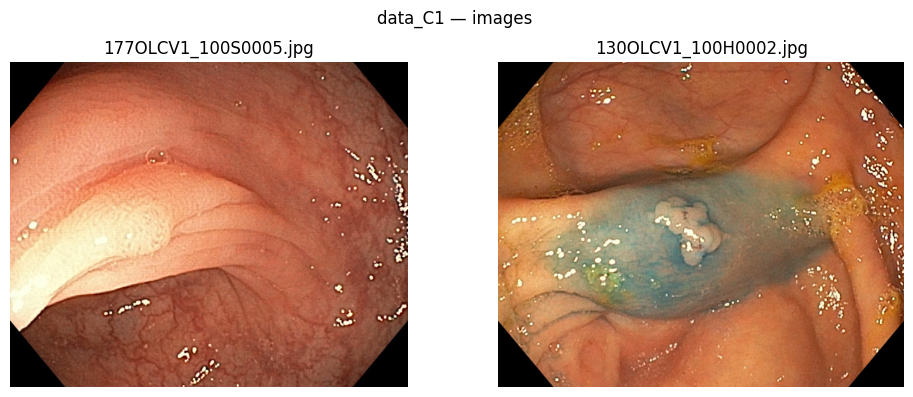

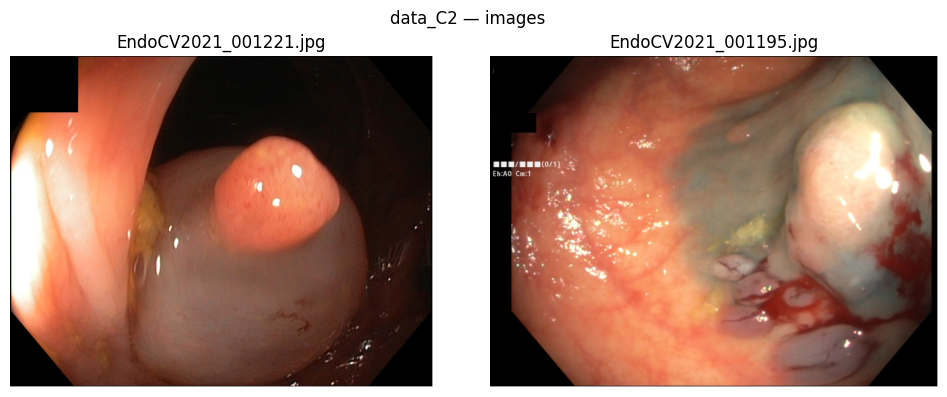

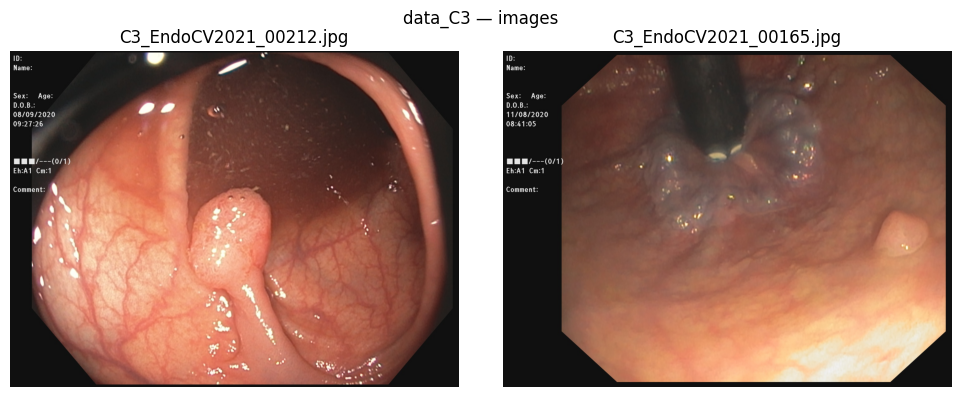

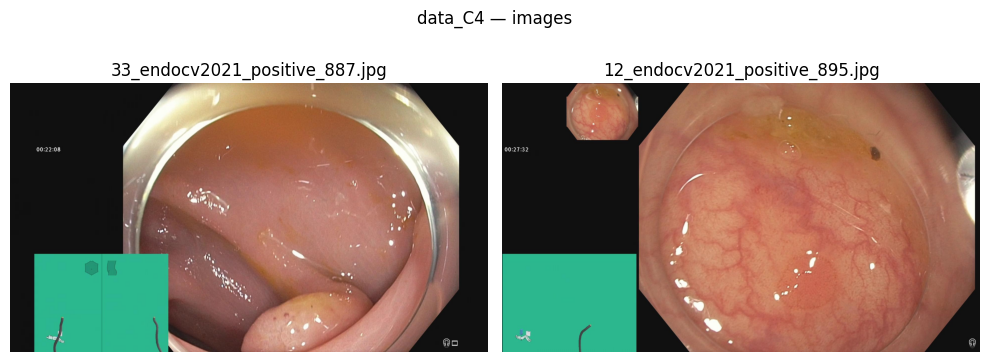

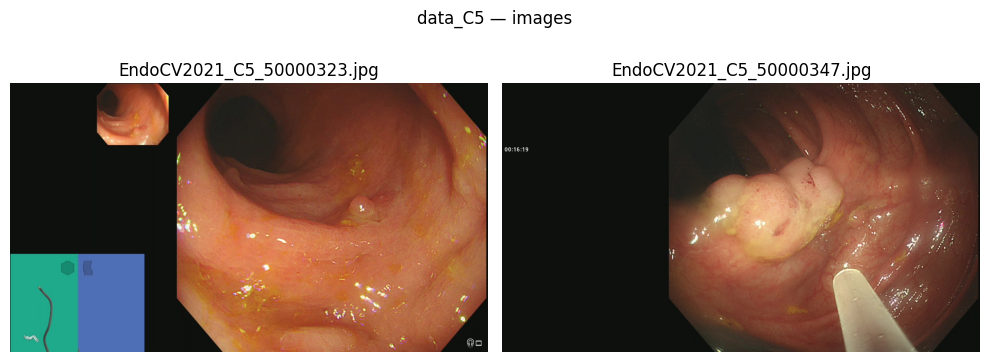

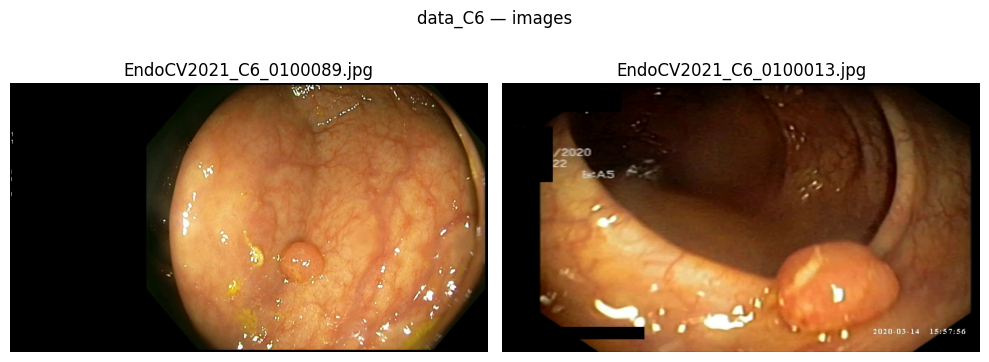

In [22]:
for e in [x for x in entries if x["kind"] == "center"]:
    name = e["group"]
    imgs = sample_images(e["images_dir"], N_IMG_PER_CENTER_SUBKIND)
    show_images_row(imgs, suptitle=f"{name} — images")

### 2.b. Two Images per Center with Bounding Boxes


=== data_C1 — bbox_images_* samples ===


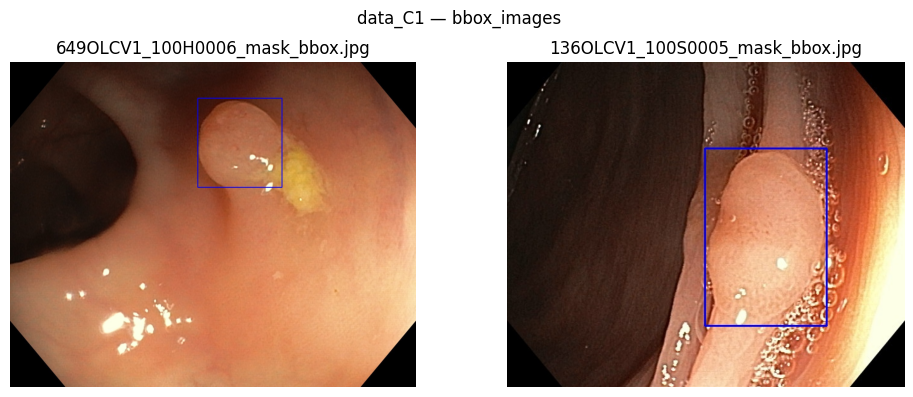


=== data_C2 — bbox_images_* samples ===


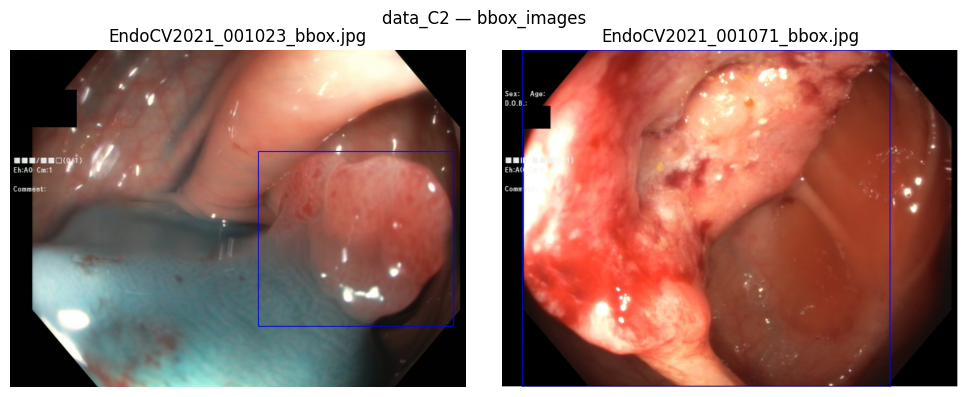


=== data_C3 — bbox_images_* samples ===


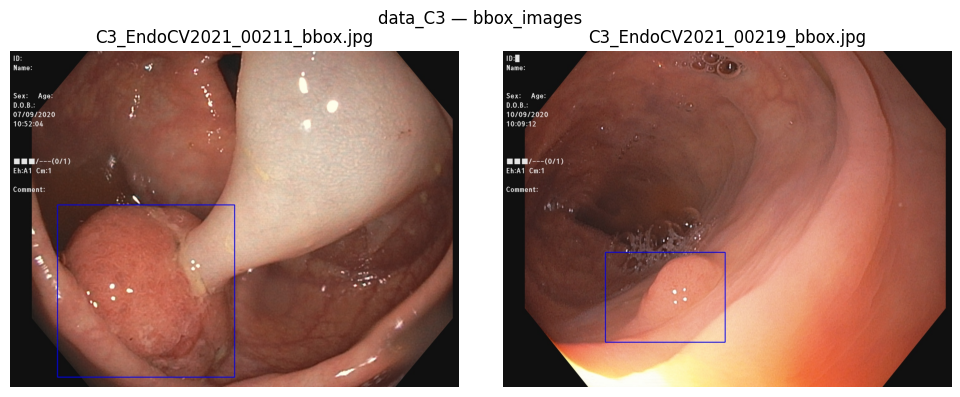


=== data_C4 — bbox_images_* samples ===


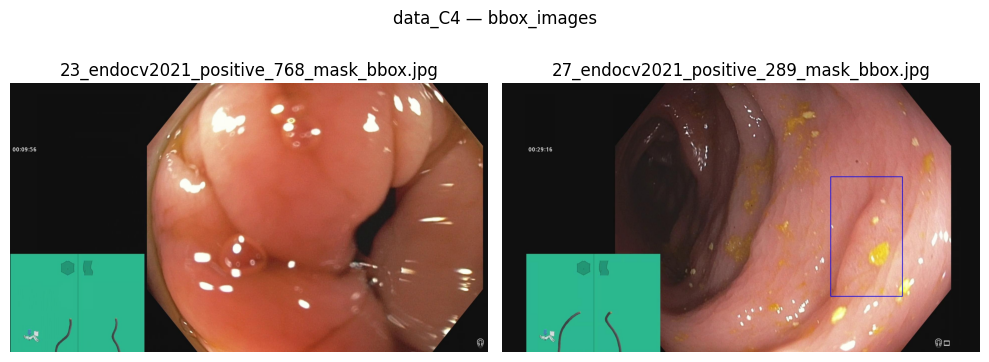


=== data_C5 — bbox_images_* samples ===


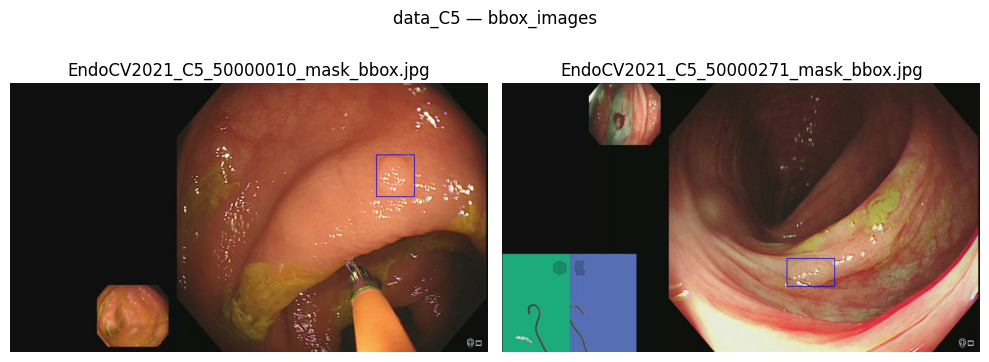


=== data_C6 — bbox_images_* samples ===


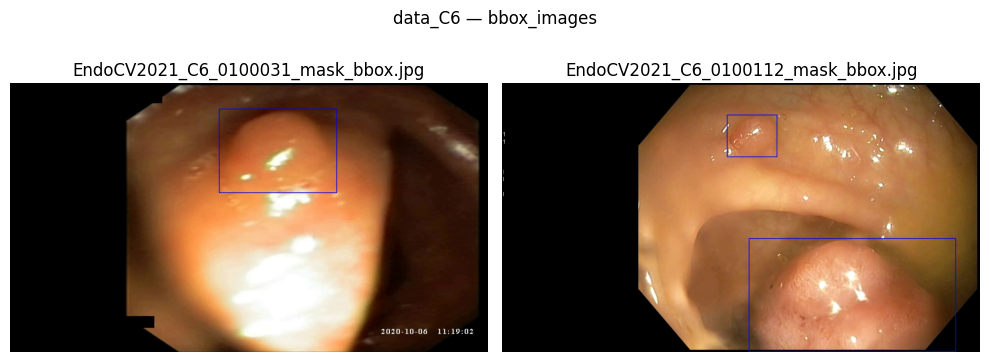

In [23]:
for e in [x for x in entries if x["kind"] == "center"]:
    name = e["group"]
    bimgs = sample_images(e["bbox_images_dir"], N_IMG_PER_CENTER_SUBKIND)
    print(f"\n=== {name} — bbox_images_* samples ===")
    show_images_row(bimgs, suptitle=f"{name} — bbox_images")

### Observation
- In **Center 4**, a couple files appear in the `bbox_images_C4` folder without associated bounding boxes drawn.  
- These cases should be excluded or handled separately.

### 2.c. Two Bounding Box Text Files per Center

In [26]:
for e in [x for x in entries if x["kind"] == "center"]:
    name = e["group"]
    print(f"\n=== {name} — sample bbox txt files ===")
    head_txt_files(e["bbox_txt_dir"], n_files=2, max_lines=5)


=== data_C1 — sample bbox txt files ===

--- 100H0050_mask.txt ---
  polyp 624 544 872 704

--- 100S0001_mask.txt ---
  

=== data_C2 — sample bbox txt files ===

--- EndoCV2021_001000.txt ---
  polyp 1235 568 1432 701

--- EndoCV2021_001001.txt ---
  polyp 864 384 1247 704

=== data_C3 — sample bbox txt files ===

--- C3_EndoCV2021_001.txt ---
  polyp 320 24 1064 752

--- C3_EndoCV2021_0010.txt ---
  polyp 416 520 656 712

=== data_C4 — sample bbox txt files ===

--- 10_endocv2021_positive_1006_mask.txt ---
  polyp 1272 283 1744 696

--- 10_endocv2021_positive_1087_mask.txt ---
  polyp 1296 456 1504 664

=== data_C5 — sample bbox txt files ===

--- EndoCV2021_C5_50000003_mask.txt ---
  polyp 1312 600 1520 800

--- EndoCV2021_C5_50000005_mask.txt ---
  

=== data_C6 — sample bbox txt files ===

--- EndoCV2021_C6_0100001_mask.txt ---
  polyp 776 776 1360 1064

--- EndoCV2021_C6_0100003_mask.txt ---
  polyp 944 472 1320 720


# 3. Visual Sampling from Positive Sequence Images: Seq_1

### 3.a.Positive Sequence Images

=== seq1 — Positive Sequence ===


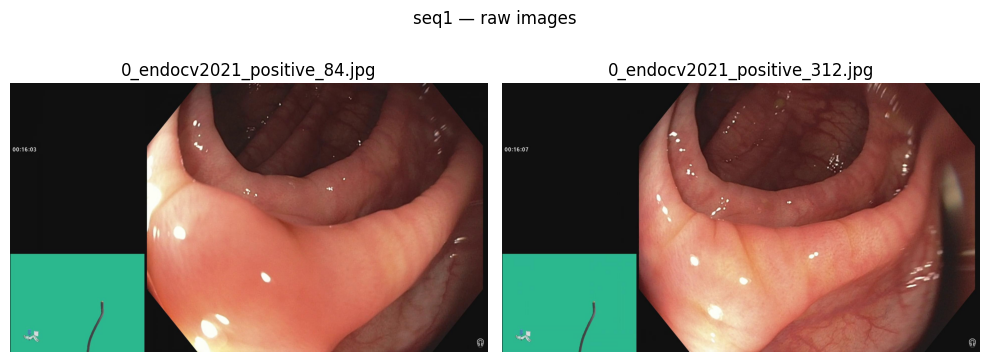

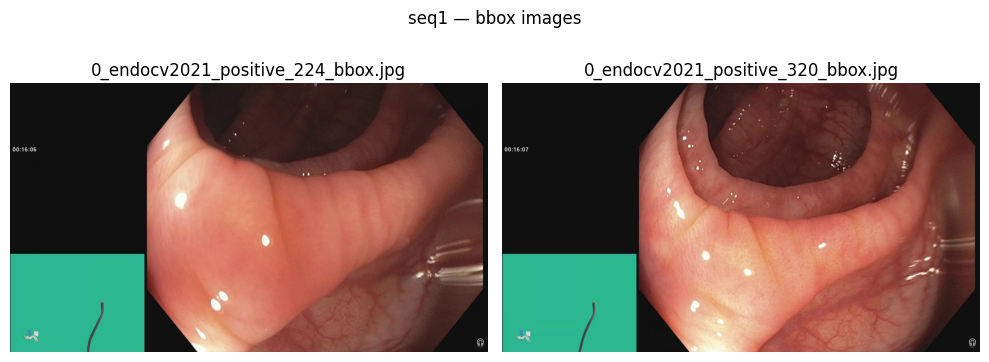


--- bbox txt samples for seq1 ---

--- 0_endocv2021_positive_104.txt ---
  

--- 0_endocv2021_positive_106.txt ---
  


In [27]:
# pick one positive sequence (seq1)
seq_entry = next((x for x in entries if x["group"] == "seq1" and x["kind"] == "seq_pos"), None)

if not seq_entry:
    print("[INFO] seq1 not found in entries.")
else:
    print(f"=== {seq_entry['group']} — Positive Sequence ===")
    
    # show 2 raw images
    imgs = sample_images(seq_entry["images_dir"], 2)
    show_images_row(imgs, suptitle=f"{seq_entry['group']} — raw images")

    # show 2 bbox_images if available
    if seq_entry.get("bbox_images_dir"):
        bimgs = sample_images(seq_entry["bbox_images_dir"], 2)
        show_images_row(bimgs, suptitle=f"{seq_entry['group']} — bbox images")

    # show 2 bbox txt files if available
    if seq_entry.get("bbox_txt_dir"):
        print(f"\n--- bbox txt samples for {seq_entry['group']} ---")
        head_txt_files(seq_entry["bbox_txt_dir"], n_files=2, max_lines=5)

=== seq2 — Positive Sequence ===


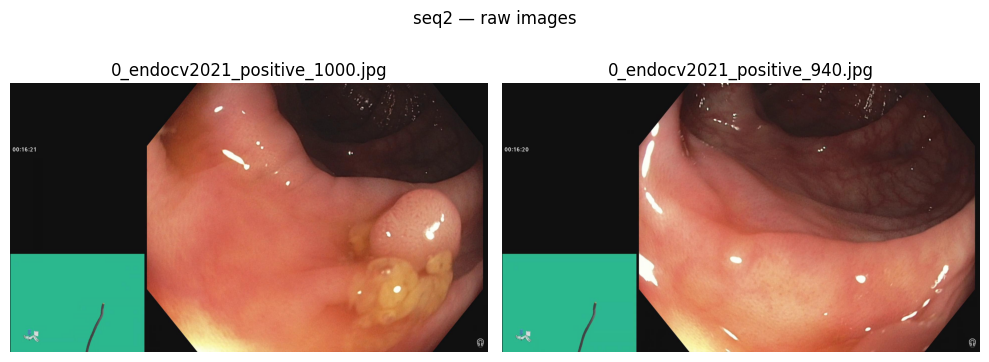

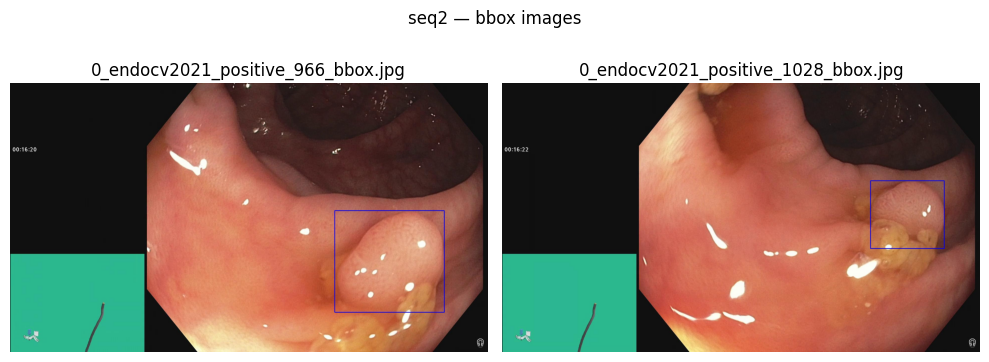


--- bbox txt samples for seq2 ---

--- 0_endocv2021_positive_1000.txt ---
  polyp 1440 416 1816 768

--- 0_endocv2021_positive_1009.txt ---
  polyp 1320 384 1800 864


In [29]:
# pick one positive sequence (seq2)
seq_entry = next((x for x in entries if x["group"] == "seq2" and x["kind"] == "seq_pos"), None)

if not seq_entry:
    print("[INFO] seq1 not found in entries.")
else:
    print(f"=== {seq_entry['group']} — Positive Sequence ===")
    
    # show 2 raw images
    imgs = sample_images(seq_entry["images_dir"], 2)
    show_images_row(imgs, suptitle=f"{seq_entry['group']} — raw images")

    # show 2 bbox_images if available
    if seq_entry.get("bbox_images_dir"):
        bimgs = sample_images(seq_entry["bbox_images_dir"], 2)
        show_images_row(bimgs, suptitle=f"{seq_entry['group']} — bbox images")

    # show 2 bbox txt files if available
    if seq_entry.get("bbox_txt_dir"):
        print(f"\n--- bbox txt samples for {seq_entry['group']} ---")
        head_txt_files(seq_entry["bbox_txt_dir"], n_files=2, max_lines=5)

### Observation: Sequence: **seq1** (Positive)

- The images in `sequenceData/positive/seq1/bbox_image_seq1/` appear **without bounding boxes drawn**, despite being in the bbox-visualization folder.
- The corresponding files under `sequenceData/positive/seq1/bbox_seq1/` are **empty (no box lines)** for these cases.
- This issue seems **localized to `seq1`** based on initial checks; other sequences did not show the same problem (will verify further).

### 3.b.Negative Sequence Images

=== seq1_neg — Negative Sequence ===


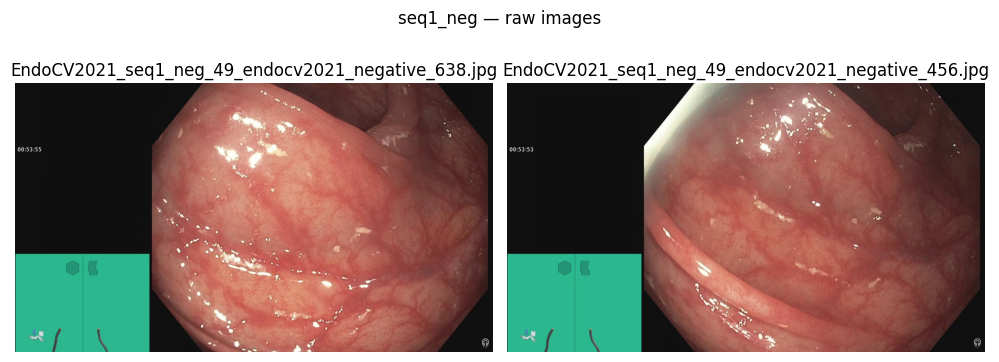

[INFO] seq1_neg has no bbox_images or bbox_txt (as expected).


In [30]:
# pick one negative sequence (seq1_neg)
neg_entry = next((x for x in entries if x["group"] == "seq1_neg" and x["kind"] == "seq_neg"), None)

if not neg_entry:
    print("[INFO] seq1_neg not found in entries.")
else:
    print(f"=== {neg_entry['group']} — Negative Sequence ===")
    
    # show 2 raw images
    imgs = sample_images(neg_entry["images_dir"], 2)
    show_images_row(imgs, suptitle=f"{neg_entry['group']} — raw images")

    # negative sequences do not have bbox_images or bbox_txt
    print(f"[INFO] {neg_entry['group']} has no bbox_images or bbox_txt (as expected).")

# 4. Image-Level Statistics

In [41]:
# Build image-level dataframe for RAW images only (images_*), with matched bbox stats
records = []
for e in entries:
    img_dir   = e.get("images_dir")
    bbox_dir  = e.get("bbox_txt_dir")
    mask_dir  = e.get("masks_dir")

    if not img_dir or not img_dir.exists():
        continue

    # (optional) prebuild an index to robustly match txts even if names vary
    #bbox_index = build_bbox_index(bbox_dir)  # assumes you added this helper earlier

    for ip in sorted(img_dir.rglob("*")):
        if not is_img(ip):
            continue

        W, H, C = img_whc(ip)

        # --- match bbox/mask by filename stem (robust) ---
        cand_bbox = find_bbox_txts_for_image(ip, bbox_dir)  # or: find_bbox_txts_for_image(ip, bbox_dir)
        boxes     = read_abs_bboxes(cand_bbox[0]) if cand_bbox else []
        cand_mask = list(mask_dir.glob(f"{ip.stem}*")) if mask_dir else []

        # --- bbox stats ---
        bw = [max(0.0, (x2 - x1)) for (x1, y1, x2, y2) in boxes]
        bh = [max(0.0, (y2 - y1)) for (x1, y1, x2, y2) in boxes]
        areas = [w * h for w, h in zip(bw, bh)]
        rel_areas = ([a / (W * H) for a in areas] if (W and H and W > 0 and H > 0) else None)
        aspects = [(w / h) if (h and h > 1e-9) else np.inf for w, h in zip(bw, bh)]
        centers = [((x1 + x2) / 2, (y1 + y2) / 2) for (x1, y1, x2, y2) in boxes] if boxes else []

        records.append({
            # group info
            "kind": e["kind"],                      # center / seq_pos / seq_neg
            "dataset_center": e["group"],           # data_Cx / seqY
            "subkind": "images",                    # only raw images
            # image info
            "image_id": ip.stem,
            "image_w": W, "image_h": H, "image_c": C,
            "image_path": str(ip),
            # bbox info
            "bbox_paths": [str(p) for p in cand_bbox] if cand_bbox else None,
            "num_bboxes": len(boxes),
            "bbox_areas": areas if areas else None,
            "bbox_rel_areas": rel_areas,           # keep list or None (don’t gate with any())
            "bbox_aspect_ratios": aspects if aspects else None,
            "bbox_centers": centers if centers else None,
            # masks (if any)
            "mask_paths": [str(p) for p in cand_mask] if cand_mask else None,
        })

df_images_full = pd.DataFrame.from_records(records)
display(df_images_full.head(3))
print("Rows (raw images only):", len(df_images_full))

,kind,dataset_center,subkind,image_id,image_w,image_h,image_c,image_path,bbox_paths,num_bboxes,bbox_areas,bbox_rel_areas,bbox_aspect_ratios,bbox_centers,mask_paths
0,center,data_C1,images,100H0050,1350,1080,3,C:\Users\Betul\Desktop\Projects\Polyp\data\Pol...,[C:\Users\Betul\Desktop\Projects\Polyp\data\Po...,1,[39680.0],[0.027215363511659808],[1.55],"[(748.0, 624.0)]",[C:\Users\Betul\Desktop\Projects\Polyp\data\Po...
1,center,data_C1,images,100S0001,628,513,3,C:\Users\Betul\Desktop\Projects\Polyp\data\Pol...,[C:\Users\Betul\Desktop\Projects\Polyp\data\Po...,0,None,[],None,None,[C:\Users\Betul\Desktop\Projects\Polyp\data\Po...
2,center,data_C1,images,100S0003,628,513,3,C:\Users\Betul\Desktop\Projects\Polyp\data\Pol...,[C:\Users\Betul\Desktop\Projects\Polyp\data\Po...,1,[122496.0],[0.3802287033933028],[1.7575757575757576],"[(288.0, 244.0)]",[C:\Users\Betul\Desktop\Projects\Polyp\data\Po...


Rows (raw images only): 8037


### 4.A. Image resolution (width × height)

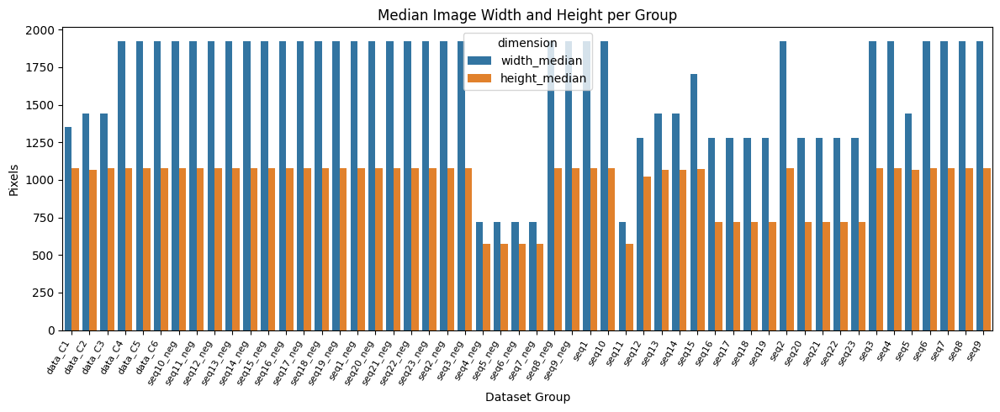

In [68]:
plt.figure(figsize=(12,5))
df_melt = df_agg.melt(id_vars=["group"], value_vars=["width_median","height_median"],
                      var_name="dimension", value_name="pixels")
sns.barplot(data=df_melt, x="group", y="pixels", hue="dimension")
plt.xticks(rotation=60, ha="right", fontsize=8)
plt.title("Median Image Width and Height per Group")
plt.ylabel("Pixels"); plt.xlabel("Dataset Group")
plt.tight_layout(); plt.show()

### 4.B. How Many Images Per Group? How many Images Have Boundary Boxes?

,kind,dataset_center,n_images,n_with_boxes,mean_boxes,p95_boxes,n_without_boxes
0,center,data_C1,256,251,1.082031,2.0,5
1,center,data_C2,301,269,0.980066,2.0,32
2,center,data_C3,457,392,1.015317,2.0,65
3,center,data_C4,227,146,0.682819,1.0,81
4,center,data_C5,208,206,1.173077,2.0,2


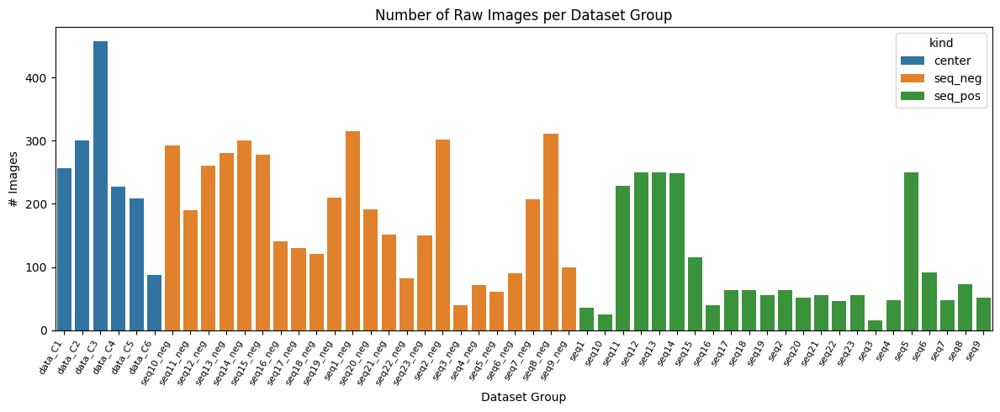

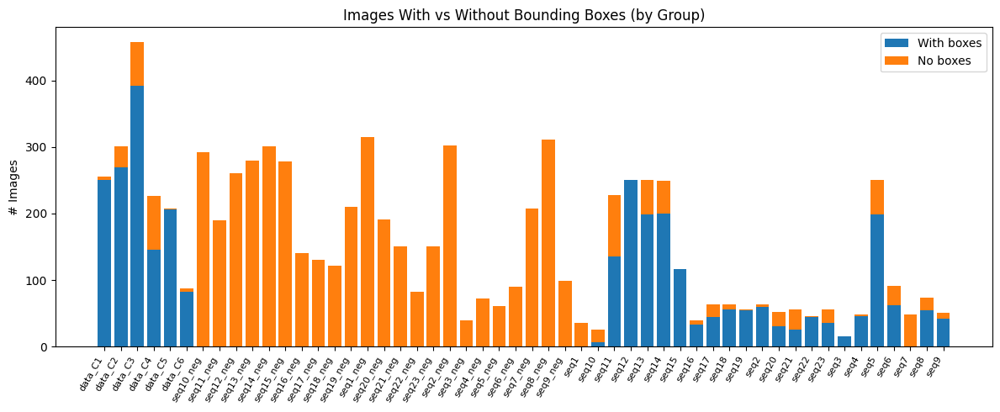

In [64]:
# tidy summary by group (center / sequence)
grp = (
    df_images_full
    .groupby(["kind","dataset_center"], as_index=False)
    .agg(
        n_images      = ("image_id","count"),
        n_with_boxes  = ("num_bboxes", lambda s: (pd.to_numeric(s, errors="coerce").fillna(0) > 0).sum()),
        mean_boxes    = ("num_bboxes", lambda s: pd.to_numeric(s, errors="coerce").fillna(0).mean()),
        p95_boxes     = ("num_bboxes", lambda s: pd.to_numeric(s, errors="coerce").fillna(0).quantile(0.95)),
    )
)
grp["n_without_boxes"] = grp["n_images"] - grp["n_with_boxes"]
grp = grp.sort_values(["kind","dataset_center"]).reset_index(drop=True)
display(grp.head())

# bar: number of raw images per group
plt.figure(figsize=(12,5))
sns.barplot(data=grp, x="dataset_center", y="n_images", hue="kind")
plt.title("Number of Raw Images per Dataset Group")
plt.xticks(rotation=60, ha="right", fontsize=8)
plt.xlabel("Dataset Group"); plt.ylabel("# Images")
plt.tight_layout(); plt.show()

# stacked bar: images with vs without boxes
plt.figure(figsize=(12,5))
bottom = plt.bar(grp["dataset_center"], grp["n_with_boxes"], label="With boxes")
plt.bar(grp["dataset_center"], grp["n_without_boxes"], bottom=grp["n_with_boxes"], label="No boxes")
plt.title("Images With vs Without Bounding Boxes (by Group)")
plt.xticks(rotation=60, ha="right", fontsize=8)
plt.ylabel("# Images")
plt.legend(); plt.tight_layout(); plt.show()


### 4.C. Distribution of number of boxes per image

Selected groups: ['data_C1', 'data_C2', 'data_C3', 'data_C4', 'data_C5', 'data_C6', 'seq12', 'seq13', 'seq5', 'seq14', 'seq11', 'seq1_neg']


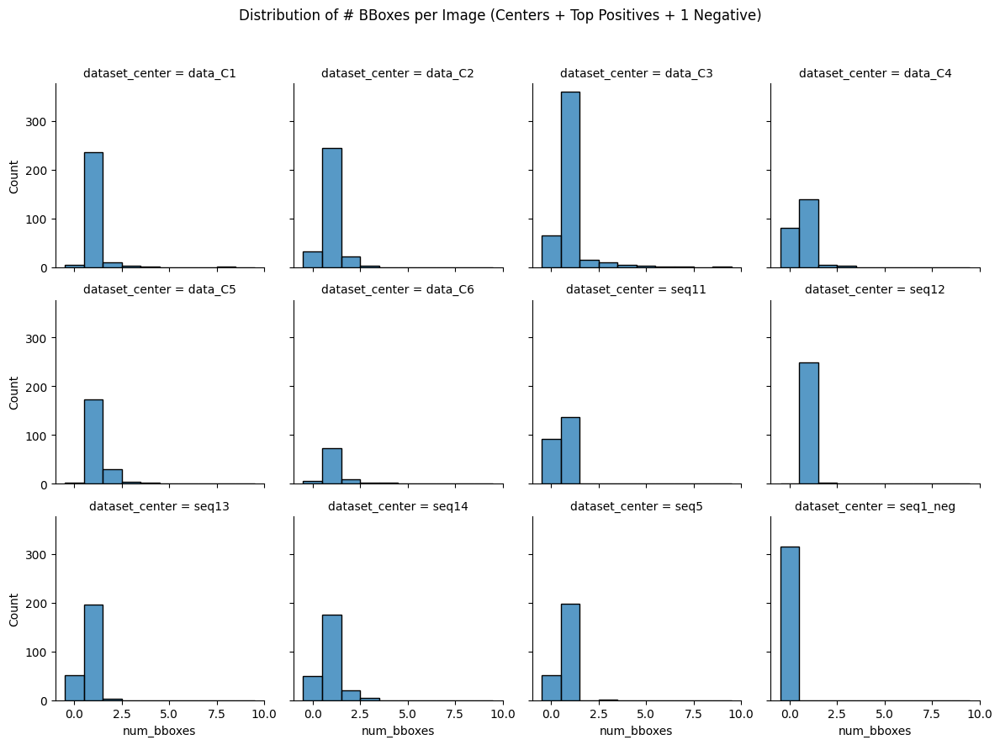

In [63]:
tmp = df_images_full.copy()
tmp["num_bboxes"] = pd.to_numeric(tmp["num_bboxes"], errors="coerce").fillna(0).astype(int)

# -------------------------------
# pick groups
# -------------------------------

# all centers
centers = sorted(tmp.loc[tmp["kind"]=="center","dataset_center"].unique())

# top positive sequences (by image count)
pos_counts = (tmp.loc[tmp["kind"]=="seq_pos"]
              .groupby("dataset_center")["image_id"].count()
              .sort_values(ascending=False))
top_pos = pos_counts.head(5).index.tolist()   # take top 5, adjust as needed

# one negative sequence (e.g., the biggest one)
neg_counts = (tmp.loc[tmp["kind"]=="seq_neg"]
              .groupby("dataset_center")["image_id"].count()
              .sort_values(ascending=False))
neg_choice = [neg_counts.index[0]] if len(neg_counts) else []

# combine selection
sel_groups = centers + top_pos + neg_choice
print("Selected groups:", sel_groups)

# -------------------------------
# Plot distributions per group
# -------------------------------
g = sns.displot(
    data=tmp[tmp["dataset_center"].isin(sel_groups)],
    x="num_bboxes", col="dataset_center", col_wrap=4,
    bins=range(0, tmp["num_bboxes"].max()+2), discrete=True, height=3
)
g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Distribution of # BBoxes per Image (Centers + Top Positives + 1 Negative)")
plt.show()

### 4.D. Relative bbox area distribution (small vs large polyps)

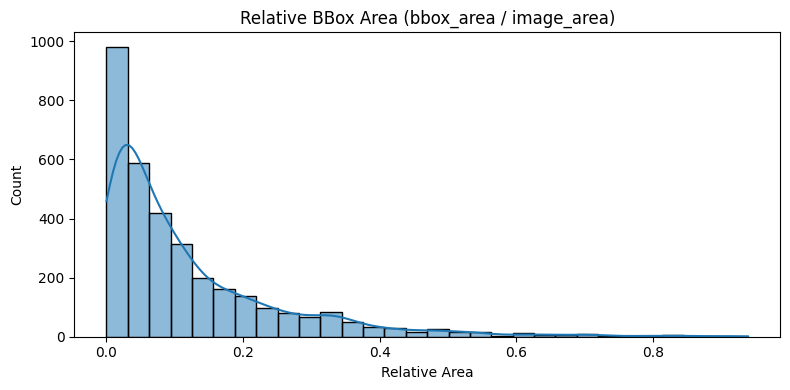

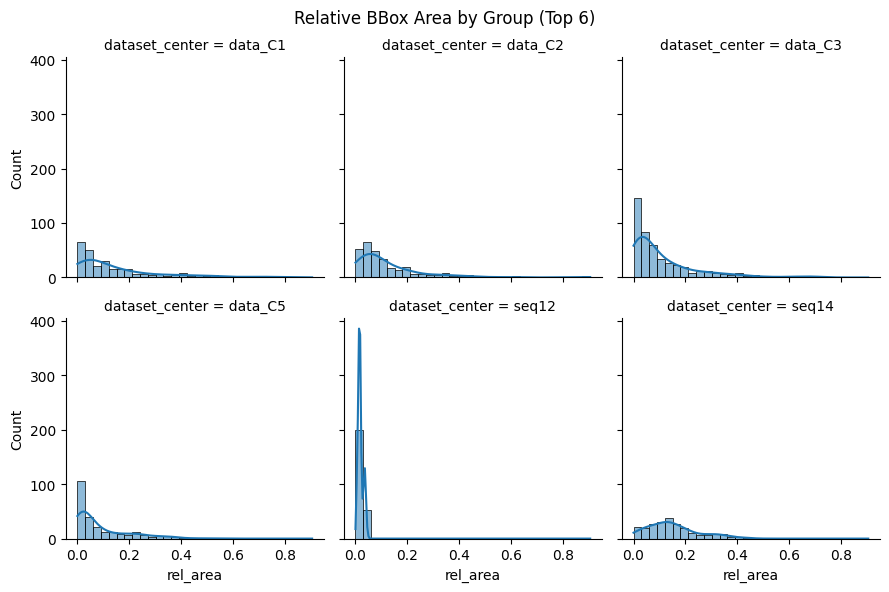

In [61]:
# explode list column -> one row per bbox
rel = (
    df_images_full[["dataset_center","bbox_rel_areas"]]
    .dropna(subset=["bbox_rel_areas"])
    .explode("bbox_rel_areas")
    .rename(columns={"bbox_rel_areas":"rel_area"})
)
rel["rel_area"] = pd.to_numeric(rel["rel_area"], errors="coerce")
rel = rel.dropna(subset=["rel_area"])

plt.figure(figsize=(8,4))
sns.histplot(rel["rel_area"], bins=30, kde=True)
plt.title("Relative BBox Area (bbox_area / image_area)")
plt.xlabel("Relative Area"); plt.ylabel("Count")
plt.tight_layout(); plt.show()

# optional: compare across groups (top 6)
top_groups = rel["dataset_center"].value_counts().head(6).index.tolist()
g = sns.displot(
    data=rel[rel["dataset_center"].isin(top_groups)],
    x="rel_area", col="dataset_center", col_wrap=3, bins=30, kde=True, height=3
)
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Relative BBox Area by Group (Top 6)")
plt.show()

# 5. Group-Level Dataset Summaries: (Center + Sequence) Summaries

In [48]:
# ---------- group-level dataset aggregation (center + sequence) ----------
def safe_list_count(x):  # counts rows; not list lengths
    return int(x.shape[0])

# counts available directories/items
def count_in_dir(d, pred_glob):
    if not d or not d.exists(): return 0
    return sum(1 for _ in d.rglob(pred_glob))

# pre-compute per-entry directory counts
dir_counts=[]
for e in entries:
    dir_counts.append({
        "kind": e["kind"], "group": e["group"],
        "n_images_in_images_dir":      count_in_dir(e["images_dir"],      "*"),
        "n_images_in_bbox_images_dir": count_in_dir(e["bbox_images_dir"], "*"),
        "n_txt_in_bbox_dir":           count_in_dir(e["bbox_txt_dir"],    "*.txt"),
    })
df_dir_counts = pd.DataFrame(dir_counts)

# image size stats from original images (exclude bbox_images to avoid double-counting)
base = df_images_full[df_images_full["subkind"]=="images"].copy()
size_stats = (
    base.groupby(["kind","dataset_center"])
        .agg(
            n_image_rows = ("image_id","count"),
            width_min    = ("image_w","min"),
            width_max    = ("image_w","max"),
            height_min   = ("image_h","min"),
            height_max   = ("image_h","max"),
            width_median = ("image_w","median"),
            height_median= ("image_h","median"),
        )
        .reset_index()
        .rename(columns={"dataset_center":"group"})
)

# merge directory counts + size stats
df_agg = (
    df_dir_counts
    .merge(size_stats, on=["kind","group"], how="left")
    .sort_values(["kind","group"])
    .reset_index(drop=True)
)

display(df_agg)
print("Rows (image-level):", len(df_images_full), "| Dataset Groups:", df_agg.shape[0])

,kind,group,n_images_in_images_dir,n_images_in_bbox_images_dir,n_txt_in_bbox_dir,n_image_rows,width_min,width_max,height_min,height_max,width_median,height_median
0,center,data_C1,256,257,256,256,572,1350,498,1080,1350.0,1080.0
1,center,data_C2,301,301,301,301,672,1920,544,1080,1440.0,1064.0
2,center,data_C3,457,393,393,457,720,1440,576,1080,1440.0,1080.0
3,center,data_C4,227,227,227,227,1920,1920,1080,1080,1920.0,1080.0
4,center,data_C5,208,208,208,208,384,1920,288,1080,1920.0,1080.0
5,center,data_C6,88,88,88,88,1024,1920,768,1080,1920.0,1080.0
6,seq_neg,seq10_neg,292,0,0,292,1920,1920,1080,1080,1920.0,1080.0
7,seq_neg,seq11_neg,190,0,0,190,1920,1920,1080,1080,1920.0,1080.0
8,seq_neg,seq12_neg,261,0,0,261,1920,1920,1080,1080,1920.0,1080.0
9,seq_neg,seq13_neg,280,0,0,280,1920,1920,1080,1080,1920.0,1080.0


Rows (image-level): 8037 | Dataset Groups: 52


### Observation: Missing Bounding boxes in **C3** Data

-The directory `data_C3/images_C3` contains 457 images, while only 393 of them have corresponding bounding box annotations in `data_C3/bbox_image_C3`. This means 64 images lack annotation files, and we will exclude those images from training.

### 5. A. Images, bbox_images, txts files per Dataset Group

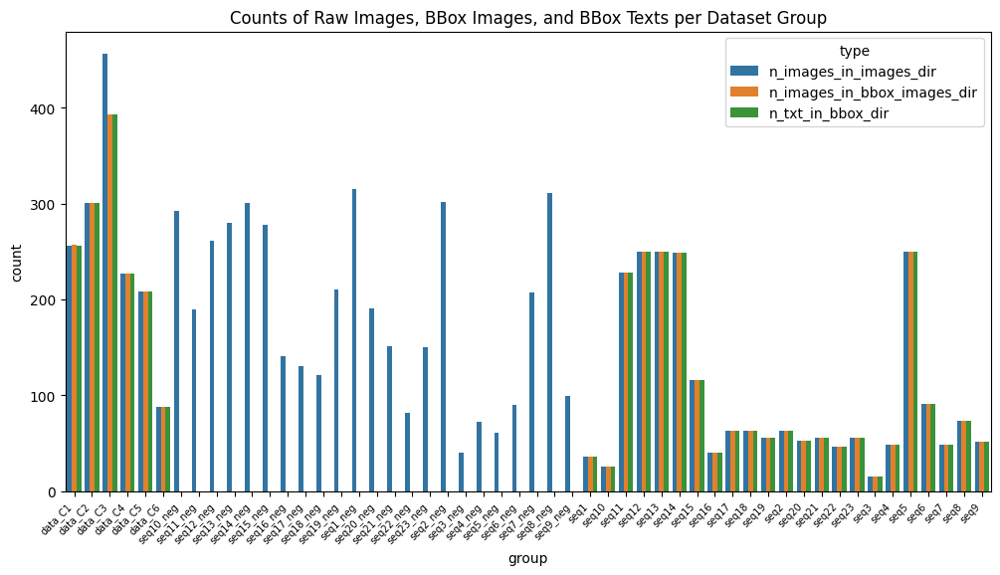

In [ ]:
df_agg_melt = df_agg.melt(id_vars=["group","kind"],
                          value_vars=["n_images_in_images_dir",
                                      "n_images_in_bbox_images_dir",
                                      "n_txt_in_bbox_dir"],
                          var_name="type", value_name="count")
plt.figure(figsize=(12,6))
sns.barplot(data=df_agg_melt, x="group", y="count", hue="type")
plt.title("Counts of Raw Images, BBox Images, and BBox Texts per Dataset Group")
plt.xticks(rotation=45, ha="right", fontsize=7)
plt.show()

## Does No Bounding Box Mean Negative

In the pos_seq directory, some images do not have any bounding boxes. We will print these images to check whether this is due to a labeling error or if there are simply no visible polyps present.

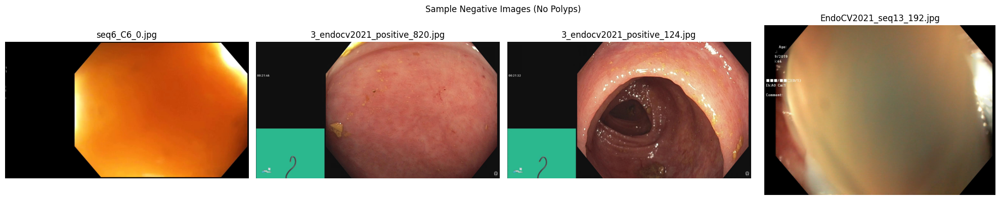

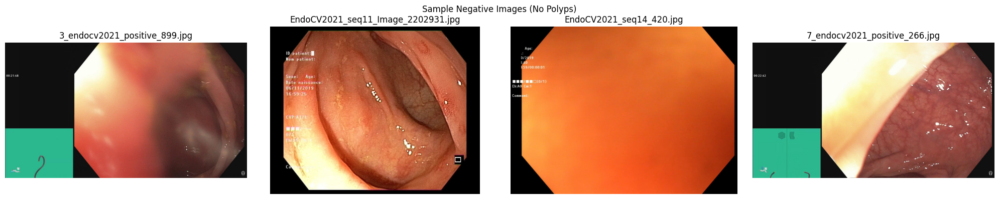

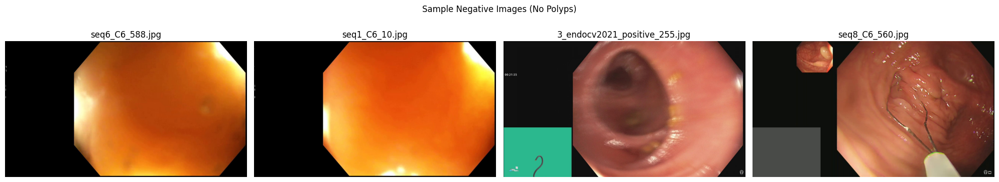

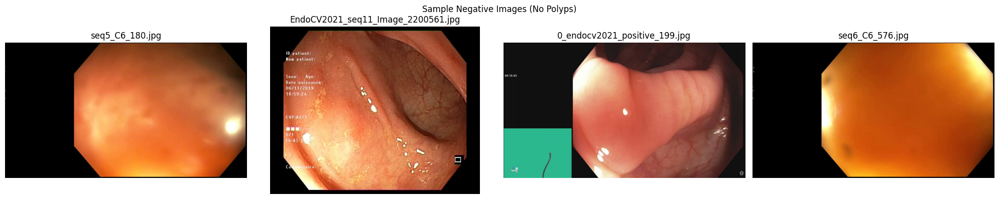

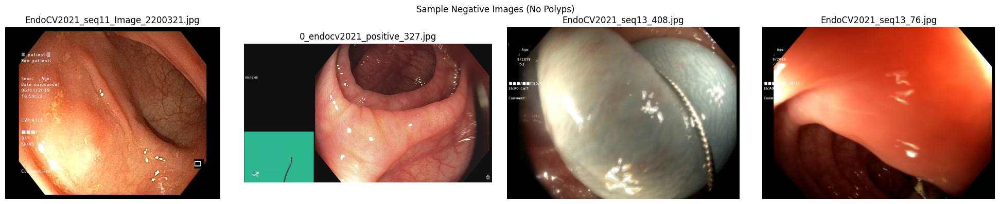

In [77]:
# filter negatives (no bounding boxes)
negatives_in_pos_seq = df_images_full.loc[(df_images_full['kind']=='seq_pos') & (df_images_full["num_bboxes"] == 0)]

num_images = 20
sample_negs = negatives_in_pos_seq.sample(num_images, random_state=42)

for i in range(int(num_images/4)):
    show_images_row([Path(p) for p in sample_negs["image_path"].tolist()[4*i:4*i+4]],
                suptitle="Sample Negative Images (No Polyps)")

In [80]:
df_images_full.groupby('dataset_center')['num_bboxes'].value_counts()

dataset_center  num_bboxes
data_C1         1             236
                2              10
                0               5
                3               3
                4               1
                             ... 
seq8            2               4
seq8_neg        0             311
seq9            1              42
                0               9
seq9_neg        0              99
Name: count, Length: 111, dtype: int64

,dataset_center,n_images,n_with_box,n_without_box,pct_with_box,pct_without_box
0,data_C1,256,251,5,98.0%,2.0%
1,data_C2,301,269,32,89.4%,10.6%
2,data_C3,457,392,65,85.8%,14.2%
3,data_C4,227,146,81,64.3%,35.7%
4,data_C5,208,206,2,99.0%,1.0%
5,data_C6,88,83,5,94.3%,5.7%


Centers {'TOTAL_images': 1537, 'TOTAL_with_box': 1347, 'TOTAL_without_box': 190, 'TOTAL_pct_with_box': np.float64(87.6)}


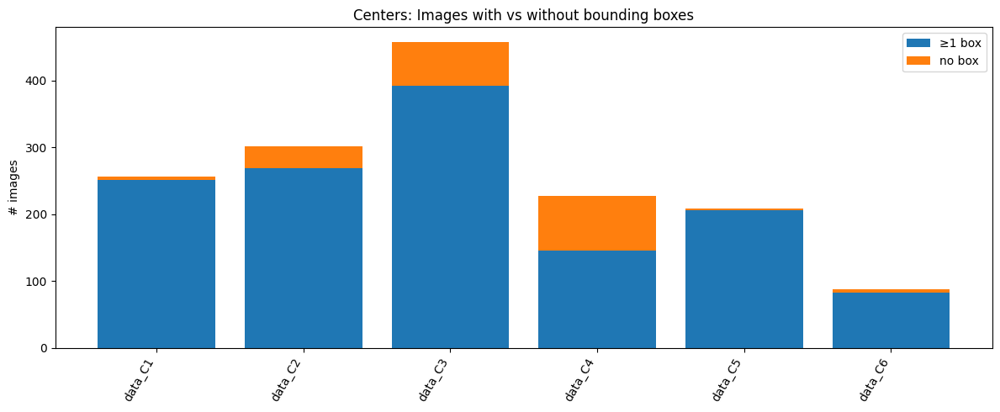

,dataset_center,n_images,n_with_box,n_without_box,pct_with_box,pct_without_box
0,seq1,36,0,36,0.0%,100.0%
1,seq10,25,7,18,28.0%,72.0%
2,seq11,228,136,92,59.6%,40.4%
3,seq12,250,250,0,100.0%,0.0%
4,seq13,250,199,51,79.6%,20.4%
5,seq14,249,200,49,80.3%,19.7%
6,seq15,116,116,0,100.0%,0.0%
7,seq16,40,33,7,82.5%,17.5%
8,seq17,63,44,19,69.8%,30.2%
9,seq18,63,56,7,88.9%,11.1%


Positive Sequences {'TOTAL_images': 2225, 'TOTAL_with_box': 1710, 'TOTAL_without_box': 515, 'TOTAL_pct_with_box': np.float64(76.9)}


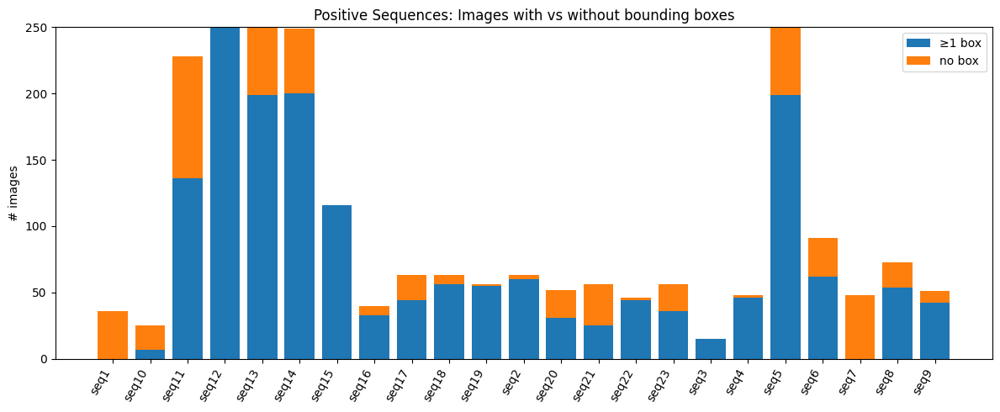

,dataset_center,n_images,n_with_box,n_without_box,pct_with_box,pct_without_box
0,seq10_neg,292,0,292,0.0%,100.0%
1,seq11_neg,190,0,190,0.0%,100.0%
2,seq12_neg,261,0,261,0.0%,100.0%
3,seq13_neg,280,0,280,0.0%,100.0%
4,seq14_neg,301,0,301,0.0%,100.0%
5,seq15_neg,278,0,278,0.0%,100.0%
6,seq16_neg,141,0,141,0.0%,100.0%
7,seq17_neg,130,0,130,0.0%,100.0%
8,seq18_neg,121,0,121,0.0%,100.0%
9,seq19_neg,210,0,210,0.0%,100.0%


Negative Sequences {'TOTAL_images': 4275, 'TOTAL_with_box': 0, 'TOTAL_without_box': 4275, 'TOTAL_pct_with_box': np.float64(0.0)}


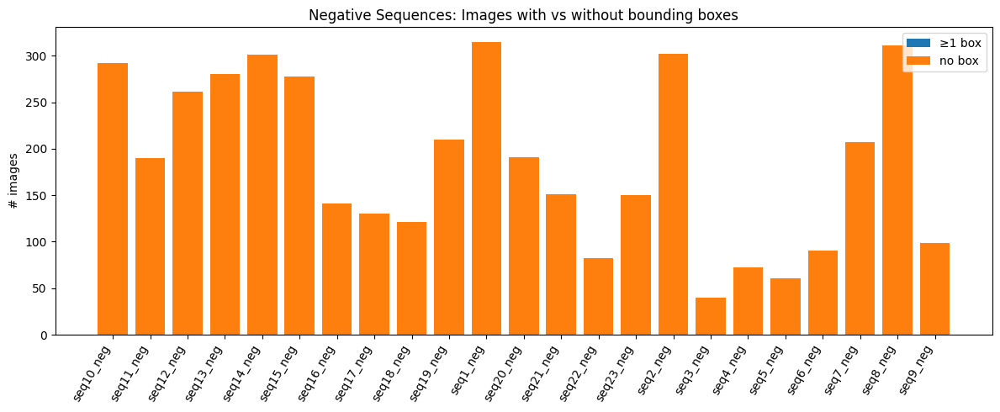

In [82]:
def summarize_boxes(df, kind_filter, title=""):
    tmp = df.copy()
    tmp = tmp[tmp["kind"]==kind_filter].copy()
    tmp["num_bboxes"] = pd.to_numeric(tmp["num_bboxes"], errors="coerce").fillna(0).astype(int)
    tmp["has_box"] = tmp["num_bboxes"] > 0

    # per-group counts
    stats = (
        tmp.groupby("dataset_center", as_index=False)
           .agg(
               n_images=("image_id","count"),
               n_with_box=("has_box","sum")
           )
    )
    stats["n_without_box"] = stats["n_images"] - stats["n_with_box"]
    stats["pct_with_box"] = (stats["n_with_box"] / stats["n_images"] * 100).round(1)
    stats["pct_without_box"] = (100 - stats["pct_with_box"]).round(1)
    stats = stats.sort_values("dataset_center").reset_index(drop=True)

    # show table
    display(stats.style.format({
        "pct_with_box":"{:.1f}%", "pct_without_box":"{:.1f}%"
    }).background_gradient(subset=["pct_with_box"], cmap="YlGn"))

    # overall totals
    totals = {
        "TOTAL_images": int(stats["n_images"].sum()),
        "TOTAL_with_box": int(stats["n_with_box"].sum()),
        "TOTAL_without_box": int(stats["n_without_box"].sum()),
        "TOTAL_pct_with_box": round(stats["n_with_box"].sum() / max(1, stats["n_images"].sum()) * 100, 1)
    }
    print(title, totals)

    # stacked bar
    plt.figure(figsize=(12,5))
    x = stats["dataset_center"]
    y1 = stats["n_with_box"]
    y0 = stats["n_without_box"]
    plt.bar(x, y1, label="≥1 box")
    plt.bar(x, y0, bottom=y1, label="no box")
    plt.ylabel("# images")
    plt.title(f"{title}: Images with vs without bounding boxes")
    plt.xticks(rotation=60, ha="right")
    plt.legend()
    plt.tight_layout()
    plt.show()

# ---- run for centers and sequences ----
summarize_boxes(df_images_full, "center", title="Centers")
summarize_boxes(df_images_full, "seq_pos", title="Positive Sequences")
summarize_boxes(df_images_full, "seq_neg", title="Negative Sequences")


### Possible Train Test Validation Split, Percentage of Positive and negative

In [88]:
train_list = [f"seq{i}" for i in range(2, 14)]     # seq2 – seq13
valid_list = [f"seq{i}" for i in range(14, 16)]    # seq14 – seq15
test_list  = [f"seq{i}" for i in range(16, 24)]    # seq16 – seq23

print("Train sequences:", train_list)
print("Validation sequences:", valid_list)
print("Test sequences:", test_list)

Train sequences: ['seq2', 'seq3', 'seq4', 'seq5', 'seq6', 'seq7', 'seq8', 'seq9', 'seq10', 'seq11', 'seq12', 'seq13']
Validation sequences: ['seq14', 'seq15']
Test sequences: ['seq16', 'seq17', 'seq18', 'seq19', 'seq20', 'seq21', 'seq22', 'seq23']


In [84]:
def seq_split_ratios(df, train_list, valid_list, test_list):
    """
    Given df_images_full and split lists, return pos/neg ratios in each set.
    """
    # ensure num_bboxes is numeric
    dfc = df.copy()
    dfc["num_bboxes"] = pd.to_numeric(dfc["num_bboxes"], errors="coerce").fillna(0).astype(int)
    dfc["has_box"] = dfc["num_bboxes"] > 0

    # keep only sequences
    seq_df = dfc[dfc["kind"].isin(["seq_pos","seq_neg"])].copy()

    results = {}
    for split_name, seq_list in [("train", train_list), ("val", valid_list), ("test", test_list)]:
        subset = seq_df[seq_df["dataset_center"].isin(seq_list)]
        n_total = len(subset)
        n_pos = int(subset["has_box"].sum())
        n_neg = n_total - n_pos
        pos_pct = round(n_pos / n_total * 100, 1) if n_total > 0 else 0
        neg_pct = round(n_neg / n_total * 100, 1) if n_total > 0 else 0
        results[split_name] = {
            "total_images": n_total,
            "positives": n_pos,
            "negatives": n_neg,
            "pct_positive": pos_pct,
            "pct_negative": neg_pct
        }
    return pd.DataFrame(results).T


In [85]:
seq_ratios = seq_split_ratios(df_images_full, train_list, valid_list, test_list)
display(seq_ratios)

,total_images,positives,negatives,pct_positive,pct_negative
train,1392.0,1070.0,322.0,76.9,23.1
val,365.0,316.0,49.0,86.6,13.4
test,432.0,324.0,108.0,75.0,25.0


In [89]:
# Define splits for sequences only
train_list += [f"seq{i}_neg" for i in range(2, 14)]     # seq2 – seq13
valid_list += [f"seq{i}_neg" for i in range(14, 16)]    # seq14 – seq15
test_list  += [f"seq{i}_neg" for i in range(16, 24)]    # seq16 – seq23

print("Train sequences:", train_list)
print("Validation sequences:", valid_list)
print("Test sequences:", test_list)

Train sequences: ['seq2', 'seq3', 'seq4', 'seq5', 'seq6', 'seq7', 'seq8', 'seq9', 'seq10', 'seq11', 'seq12', 'seq13', 'seq2_neg', 'seq3_neg', 'seq4_neg', 'seq5_neg', 'seq6_neg', 'seq7_neg', 'seq8_neg', 'seq9_neg', 'seq10_neg', 'seq11_neg', 'seq12_neg', 'seq13_neg']
Validation sequences: ['seq14', 'seq15', 'seq14_neg', 'seq15_neg']
Test sequences: ['seq16', 'seq17', 'seq18', 'seq19', 'seq20', 'seq21', 'seq22', 'seq23', 'seq16_neg', 'seq17_neg', 'seq18_neg', 'seq19_neg', 'seq20_neg', 'seq21_neg', 'seq22_neg', 'seq23_neg']


In [90]:
seq_ratios = seq_split_ratios(df_images_full, train_list, valid_list, test_list)
display(seq_ratios)

,total_images,positives,negatives,pct_positive,pct_negative
train,3597.0,1070.0,2527.0,29.7,70.3
val,944.0,316.0,628.0,33.5,66.5
test,1608.0,324.0,1284.0,20.1,79.9
